In [1]:
### MOAYAD RAJJOUB 171024078
#############################################################################
###            GEREKLİ KÜTÜPHANELERİN İMPORT EDİLMESİ
#############################################################################
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sgnl
from IPython.lib.display import Audio
from scipy.io.wavfile import read
from scipy.io.wavfile import write
import zplane
%matplotlib notebook

In [2]:
#############################################################################
###            PROJEMÜZDE 3 Tür Kızartma Sesi Kullanılmıştır
#############################################################################
# Arka plandaki kızartma ses dosyalarını okutarak bunların
# boyut bilgilerini ve örnekleme frekanslarını alalım
Fs_kizartma1, kizartma1 = read('patates_kizartmasi.wav')
Fs_kizartma2, kizartma2 = read('balik_kizartmasi.wav')
Fs_kizartma3 ,kizartma3 = read('tavuk_kizartmasi.wav')

In [3]:
#############################################################################
###     Kullanmış olduğumuz kızartma seslerinin boyut bilgileri
#############################################################################
print('Patates kızartması sesinin boyutu',kizartma1.shape)
print('Balık kızartması sesinin boyutu',kizartma2.shape)
print('Tavuk kızartması Sesinin boyutu',kizartma3.shape)

Patates kızartması sesinin boyutu (882000, 2)
Balık kızartması sesinin boyutu (882000, 2)
Tavuk kızartması Sesinin boyutu (882000, 2)


In [4]:
#############################################################################
###    Kullanmış olduğumuz kızartma seslerinin örnekleme frekansı bilgileri
#############################################################################
print('Patates Kızartması Sesinin Örnekleme Frekansı',Fs_kizartma1)
print('Balık Kızartması Sesinin Örnekleme Frekansı',Fs_kizartma2)
print('Tavuk Kızartması Sesinin Örnekleme Frekansı',Fs_kizartma3)

Patates Kızartması Sesinin Örnekleme Frekansı 44100
Balık Kızartması Sesinin Örnekleme Frekansı 44100
Tavuk Kızartması Sesinin Örnekleme Frekansı 44100


### Kızartma sesi dosyalarımız 2 kanallı olup her kanalda 882000 örnek bulunmaktadır. Bu seslerin örnekleme frekansı 44100 Hz dir.

In [5]:
#############################################################################
###    Kızartma ses kanallarından sadece 1 tanesini kullanmamız yeterlidir
#############################################################################
kizartma_xn1 = kizartma1[:,1]
kizartma_xn2 = kizartma2[:,1]
kizartma_xn3 = kizartma3[:,1]

In [6]:
#############################################################################
###    Kızartma sesleri için n ve N lerin tanımlanması
#############################################################################
kizartma_N1 = len(kizartma1)
kizartma_N2 = len(kizartma2)
kizartma_N3 = len(kizartma3)
# yatay eksen aralıkları
kizartma_n1=np.arange(0,kizartma_N1)
kizartma_n2=np.arange(0,kizartma_N2)
kizartma_n3=np.arange(0,kizartma_N3)

<IPython.core.display.Javascript object>


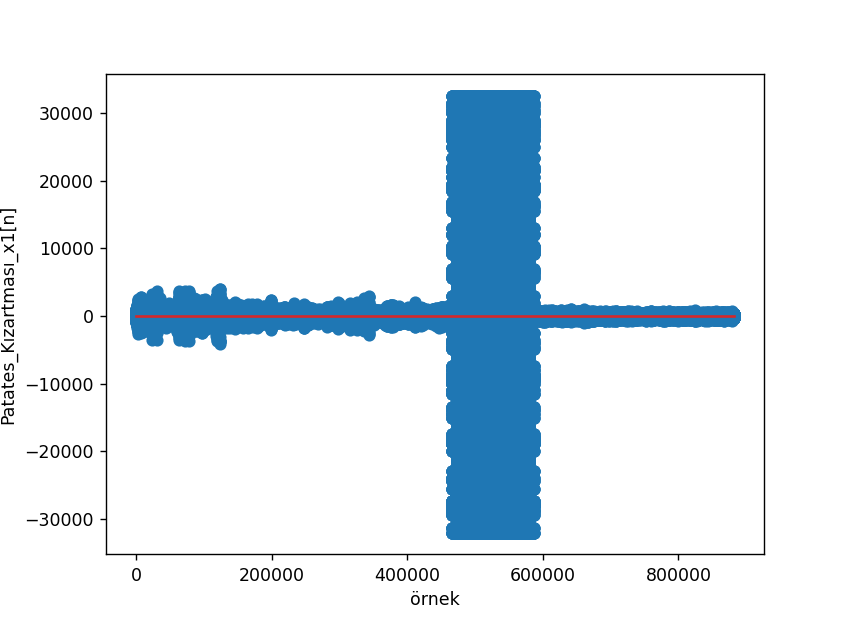

In [10]:
#########################################
# Patates kızartması sesini çizdirelim
#########################################
plt.figure()
plt.stem(kizartma_n1,kizartma_xn1)
plt.xlabel("örnek")
plt.ylabel("Patates_Kızartması_x1[n]")
plt.show()

<IPython.core.display.Javascript object>


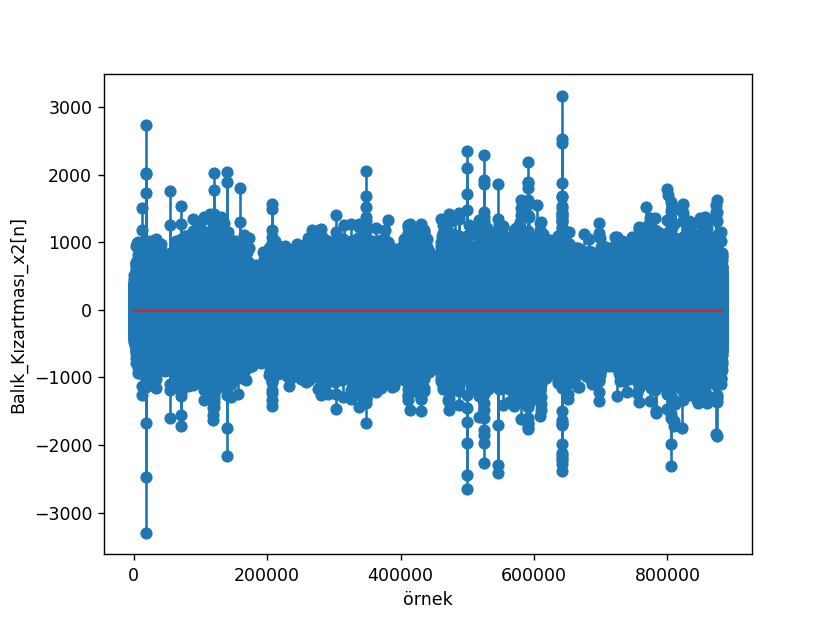

In [11]:
#########################################
# Balık kızartması sesini çizdirelim
#########################################
plt.figure()
plt.stem(kizartma_n2,kizartma_xn2)
plt.xlabel("örnek")
plt.ylabel("Balık_Kızartması_x2[n]")
plt.show()

<IPython.core.display.Javascript object>


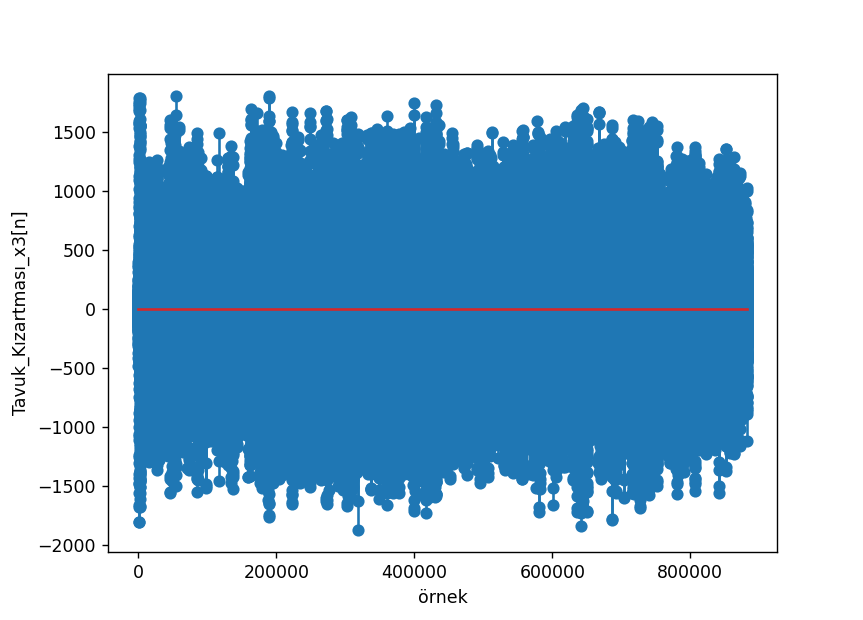

In [12]:
#########################################
# Tavuk kızartması sesini çizdirelim
#########################################
plt.figure()
plt.stem(kizartma_n3,kizartma_xn3)
plt.xlabel("örnek")
plt.ylabel("Tavuk_Kızartması_x3[n]")
plt.show()

### Kızartma seslerinin fourier dönüşümlerini alarak bu seslerin frekans spektrumlarını inceleyelim

In [13]:
N = 200
w=np.linspace(-np.pi,np.pi-(2*np.pi/N),N)

kizartma_xw1=np.fft.fftshift(np.fft.fft(kizartma_xn1,N)/N)
kizartma_xw2=np.fft.fftshift(np.fft.fft(kizartma_xn2,N)/N)
kizartma_xw3=np.fft.fftshift(np.fft.fft(kizartma_xn3,N)/N)

<IPython.core.display.Javascript object>


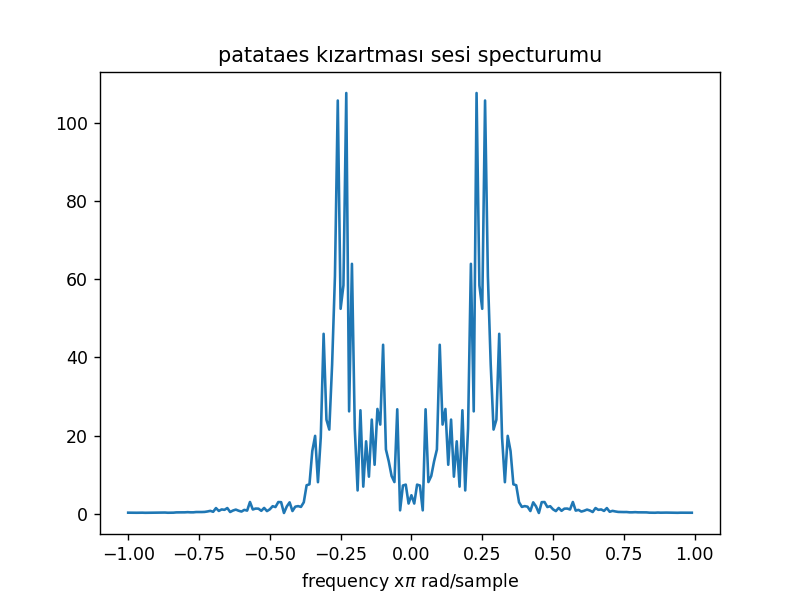

In [14]:
plt.figure()
plt.plot(w/np.pi,np.abs(kizartma_xw1))
plt.title("patataes kızartması sesi specturumu")
plt.xlabel("frequency x$\\pi$ rad/sample")
plt.show()

<IPython.core.display.Javascript object>


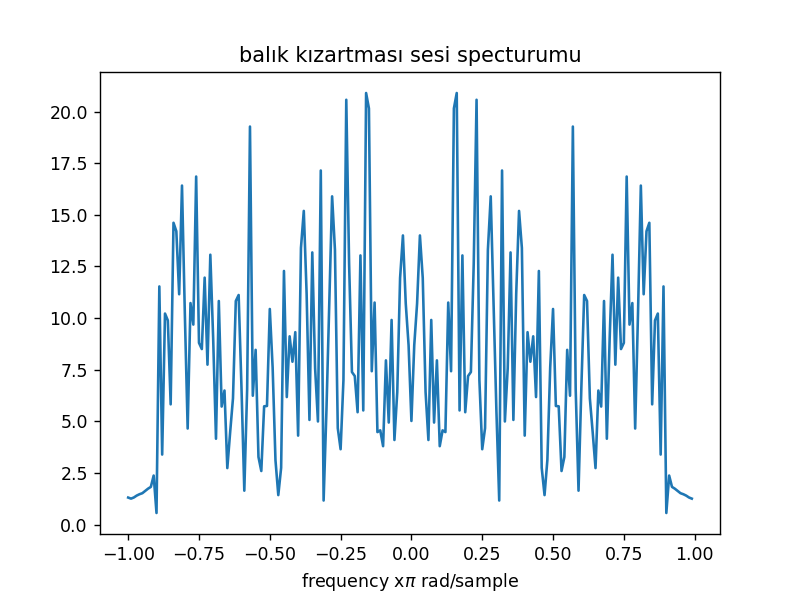

In [15]:
plt.figure()
plt.plot(w/np.pi,np.abs(kizartma_xw2))
plt.title("balık kızartması sesi specturumu")
plt.xlabel("frequency x$\\pi$ rad/sample")
plt.show()

<IPython.core.display.Javascript object>


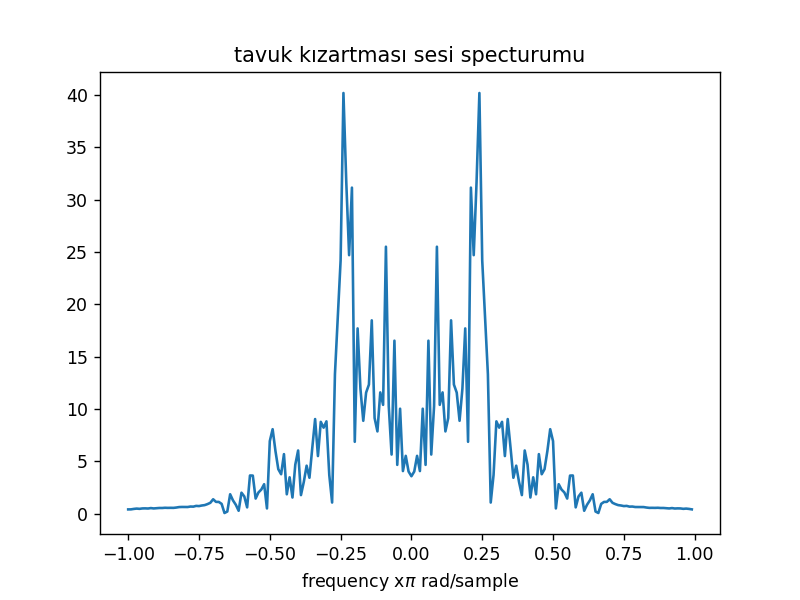

In [16]:
plt.figure()
plt.plot(w/np.pi,np.abs(kizartma_xw3))
plt.title("tavuk kızartması sesi specturumu")
plt.xlabel("frequency x$\\pi$ rad/sample")
plt.show()

In [18]:
#############################################################################
###            PROJEMİZE  Kızartma + Konuşma Seslerini ekleyelim
#############################################################################
# boyut bilgilerini ve örnekleme frekanslarını alalım
Fs_kizart_konus1, kizart_konus1 = read('konusma_ve_kizartma1.wav')
Fs_kizart_konus2, kizart_konus2 = read('konusma_ve_kizartma2.wav')
Fs_kizart_konus3 ,kizart_konus3 = read('konusma_ve_kizartma3.wav')

In [19]:
#############################################################################
###    Kullanmış Olduğumuz Kızartma + Konuşma Seslerinin Örnekleme Frekansı Bilgileri
#############################################################################
print('Patates Kızartması + Konuşma Sesinin Örnekleme Frekansı',Fs_kizart_konus1)
print('Balık Kızartması + Konuşma Sesinin Örnekleme Frekansı',Fs_kizart_konus2)
print('Tavuk Kızartması + Konuşma Sesinin Örnekleme Frekansı',Fs_kizart_konus3)

Patates Kızartması + Konuşma Sesinin Örnekleme Frekansı 44100
Balık Kızartması + Konuşma Sesinin Örnekleme Frekansı 44100
Tavuk Kızartması + Konuşma Sesinin Örnekleme Frekansı 44100


In [20]:
#############################################################################
###    Kızartma + Konuşma Ses Kanallarından Sadece 1 Tanesini Kullanmamız Yeterlidir
#############################################################################
kizart_konus_xn1 = kizart_konus1[:,1]
kizart_konus_xn2 = kizart_konus2[:,1]
kizart_konus_xn3 = kizart_konus3[:,1]

In [21]:
#############################################################################
###    Kızartma + Konuşma Sesleri için n ve N lerin tanımlanması
#############################################################################
kizart_konus_N1 = len(kizart_konus1)
kizart_konus_N2 = len(kizart_konus2)
kizart_konus_N3 = len(kizart_konus3)

In [22]:
# yatay eksen aralıkları
kizartma_konus_n1=np.arange(0,kizart_konus_N1)
kizartma_konus_n2=np.arange(0,kizart_konus_N2)
kizartma_konus_n3=np.arange(0,kizart_konus_N3)

In [24]:
Fs_konusma_ve_kizartma1, konusma_ve_kizartma1 = read('konusma_ve_kizartma1.wav')
print('Konuşma Sesi 1 Örnekleme Frekansı',Fs_konusma_ve_kizartma1)
konusma_ve_kizartma11 = konusma_ve_kizartma1[:,1]
print("Filtresiz konuşma sesi 1")
display(Audio(konusma_ve_kizartma11, rate=44100))

Konuşma Sesi 1 Örnekleme Frekansı 44100
Filtresiz konuşma sesi 1


In [25]:
b,a = sgnl.butter(10 , 0.06, 'lowpass')
filtered1 = sgnl.lfilter(b, a, konusma_ve_kizartma11)
print("Filtrelenmiş konuşma sesi")
display(Audio(filtered1, rate=44100))

Filtrelenmiş konuşma sesi


In [26]:
Fs_konusma_ve_kizartma2, konusma_ve_kizartma2 = read('konusma_ve_kizartma2.wav')
print('Konuşma Sesi 2 Örnekleme Frekansı',Fs_konusma_ve_kizartma2)
konusma_ve_kizartma22 = konusma_ve_kizartma2[:,1]
print("Filtresiz konuşma sesi 2")
display(Audio(konusma_ve_kizartma22, rate=44100))

Konuşma Sesi 2 Örnekleme Frekansı 44100
Filtresiz konuşma sesi 2


In [27]:
b,a = sgnl.butter(10 , 0.06, 'lowpass')
filtered2 = sgnl.lfilter(b, a, konusma_ve_kizartma22)
print("Filtrelenmiş konuşma sesi 2")
display(Audio(filtered2, rate=44100))

Filtrelenmiş konuşma sesi 2


In [28]:
Fs_konusma_ve_kizartma3, konusma_ve_kizartma3 = read('konusma_ve_kizartma3.wav')
print('Konuşma Sesi 3 Örnekleme Frekansı',Fs_konusma_ve_kizartma3)
konusma_ve_kizartma33 = konusma_ve_kizartma3[:,1]
print("Filtresiz konuşma sesi 3")
display(Audio(konusma_ve_kizartma33, rate=44100))

Konuşma Sesi 3 Örnekleme Frekansı 44100
Filtresiz konuşma sesi 3


In [29]:
b,a = sgnl.butter(10 , 0.06, 'lowpass')
filtered3 = sgnl.lfilter(b, a, konusma_ve_kizartma33)
print("Filtrelenmiş konuşma sesi 3")
display(Audio(filtered3, rate=44100))

Filtrelenmiş konuşma sesi 3


In [30]:
print(b)

[3.11484549e-11 3.11484549e-10 1.40168047e-09 3.73781459e-09
 6.54117554e-09 7.84941064e-09 6.54117554e-09 3.73781459e-09
 1.40168047e-09 3.11484549e-10 3.11484549e-11]


In [31]:
print(a)

[   1.           -8.79517035   34.87498282  -82.09589685  127.04294386
 -135.03554288   99.83507904  -50.69181843   16.91672279   -3.35030545
    0.29900548]


<IPython.core.display.Javascript object>


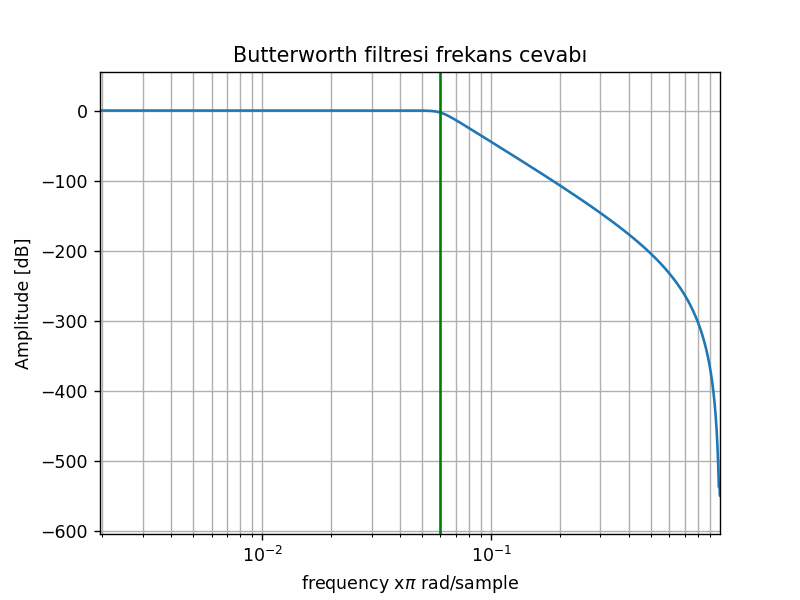

In [32]:
w, hw = sgnl.freqz(b, a)
plt.figure()
plt.semilogx(w / np.pi, 20 * np.log10(abs(hw)))
plt.title("Butterworth filtresi frekans cevabı")
plt.xlabel("frequency x$\\pi$ rad/sample")
plt.ylabel("Amplitude [dB]")
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(0.06, color='green') # cutoff radian frequency
plt.show()

<IPython.core.display.Javascript object>


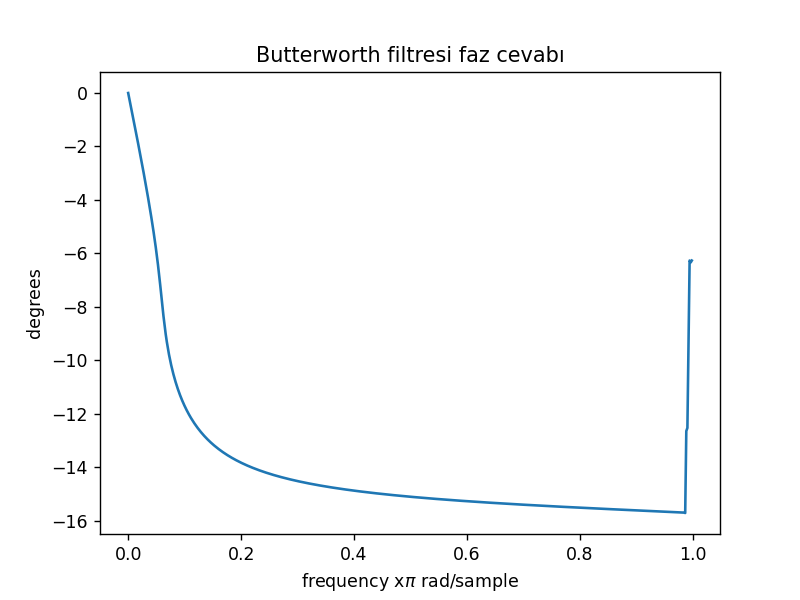

Text(0.5, 0, 'frequency x$\\pi$ rad/sample')

In [33]:
hw_phs = np.unwrap(np.angle(hw))
plt.figure()
plt.title("Butterworth filtresi faz cevabı")
plt.plot(w/np.pi, hw_phs)
plt.ylabel("degrees")
plt.xlabel("frequency x$\\pi$ rad/sample")

<IPython.core.display.Javascript object>


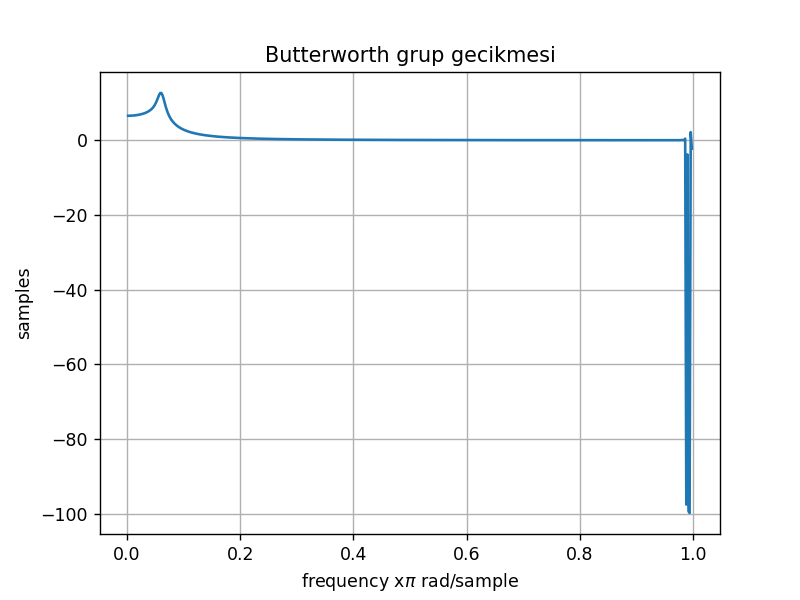

In [34]:
tau_w = -np.diff(hw_phs)*(N/(2*np.pi))
plt.figure()
plt.title("Butterworth grup gecikmesi")
plt.plot(w[1::]/np.pi, tau_w)
plt.ylabel("samples"), plt.xlabel("frequency x$\\pi$ rad/sample")
plt.grid()

<IPython.core.display.Javascript object>


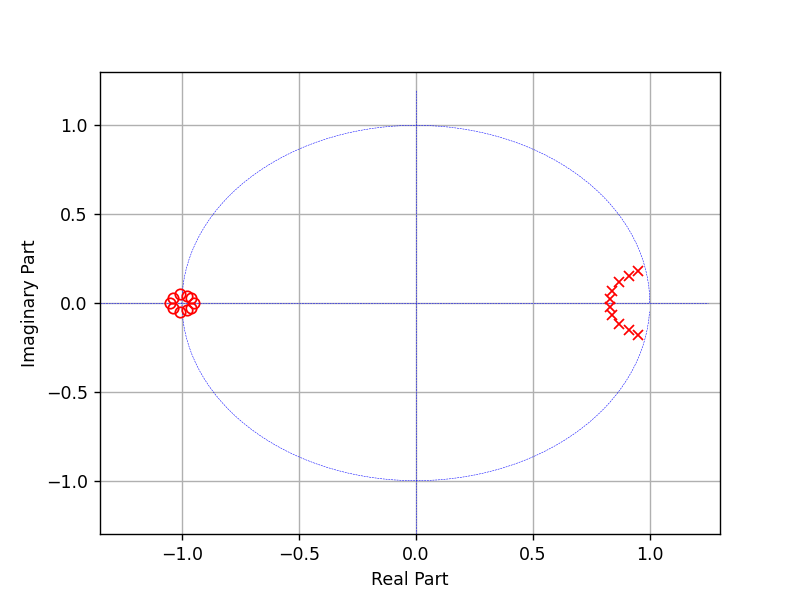

In [35]:
z,p,k = sgnl.butter(10 , 0.06, 'lowpass',output='zpk')
b,a = sgnl.zpk2tf(z,p,k)
zplane.zplane(b,a)

<IPython.core.display.Javascript object>


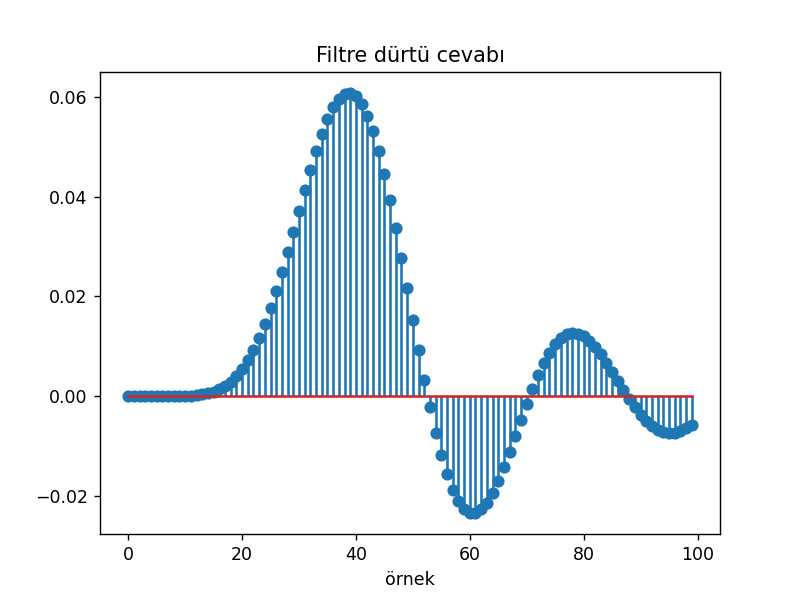

In [36]:
n, hn = sgnl.dimpulse((b,a,1), n=100)
plt.figure()
plt.stem(n, np.squeeze(hn))
plt.title("Filtre dürtü cevabı")
plt.xlabel("örnek")
plt.show()

### Grafiklerden anlaşılacağı gibi filtrenin faz cevabı lineer çıkmamış , bu nedenle grup gecikmesi sabit olmadığı
###  görülmektedir. Bu özellikler IIR filtre özelliklerdir. Butterworth filtresi tasarlandığı için  bu tür
###  grafiklerin çıkmasını beklenmektedir.